In [21]:
from libraries import *
from functions import signals 
# Define necessary variables
from functions.signals import square_wave, tremolo
from functions.generate_sound import generate_sound
from functions.effects import exponential, apply_reverb


Size: 1548
[ 5.16844245  6.52932039  7.96978619  8.3137245  10.36379846 13.26790752
 17.0402965  16.20223606 12.29205184 11.84317743  7.86364231  6.81764275
  6.22941957  5.60129968  5.47378671  8.04873033 10.59154359 17.90540109
 16.0405349  17.76696191 16.96245075 11.54681651  8.80230321  7.63297116
  4.87371047  2.63595976  6.41835155  9.32925568 13.63200281 13.7841321
 14.51359441 14.85969451 13.56832351 10.62334615  7.73283642  6.46668837
  2.74971115  4.40049964  5.49859738 10.71676801 10.96169855 14.6705643
 14.98886595 16.19022358 13.44581517 12.02130281  5.05457087  6.82329513
  4.42853464  6.17431732  8.67500876  8.19807964  9.87676436 12.03375842
 15.24185922 15.80227016 14.52390927 12.04562574  5.77679275  6.42498184
  5.856416    5.71860964  6.73723889 10.46224514 11.21414379 14.85539212
 16.90508488 15.9840145  15.11819063 11.29447028  8.29159425  6.55795286
  0.7996775   4.96821169  7.65271556  9.00899508 10.30782588 14.92211476
 18.76526331 17.46744173 14.79957862 11.53

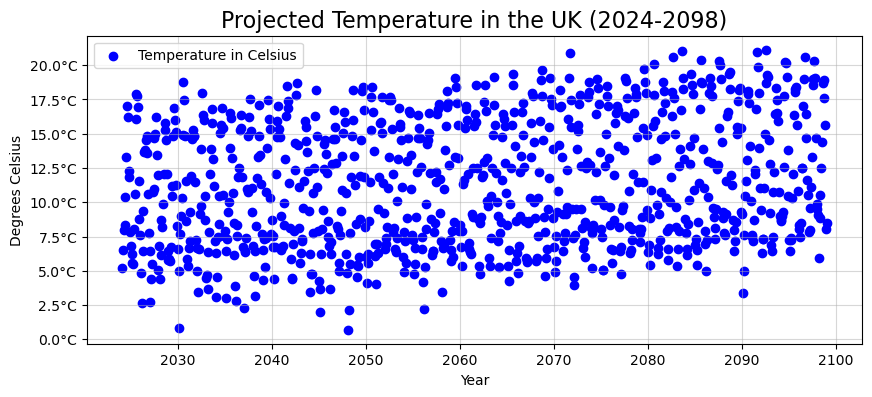

In [9]:
#### Temperature data for the UK ####

### Set the display options for the DataFrame
# @temp_path: file path
# @skiprows: skip the first 52 rows, they are metadata
# @sep: delimiter (comma in this case)
# @engine: Use Python engine for flexible parsing
# @on_bad_lines: Skip any problematic rows

# Load the data from the CSV file
temp_path = "data_files/P_CMI5_RCMO_CM20_TA-_0002m_Euro_NUT0_S197001010000_E209812312100_INS_TIM_01m_NA-_cdf_org_01_RCP85_NA---_NA---.csv"

temp_df = pd.read_csv(
    temp_path, 
    skiprows=52,  
    sep=',',      
    engine='python',  
    on_bad_lines='skip'
)

#----------------------------------------------------------------------------------------------------#
#### Data Cleaning ####
#----------------------------------------------------------------------------------------------------#

# Display the total numebr of rows to verify
rows_size = len(temp_df)
print(f"Size: {rows_size}")

# Uncomment the following to inspect the data
# temp_df.info()

# Display the first few rows to verify
# It confirms that the first 52 rows are metadata
# print(temp_df.head())

# Ensure 'Date' is parsed as a datetime column
temp_df['Date'] = pd.to_datetime(temp_df['Date'])

# No need to display the past data
# Filter rows between 2024 and 2098
temp_pred = temp_df[temp_df['Date'].dt.year >= 2024]

# Select only 'Date' and 'UK' columns
temp_uk = temp_pred[['Date', 'UK']]

# Display the resulting data
# print(temp_uk)

# Return a view inted of copy. Require for python 3.0
# https://pandas.pydata.org/docs/user_guide/copy_on_write.html
pd.options.mode.copy_on_write = True

# Convert temperature from Kelvin to Celsius
# Function based on the formula from https://www.rapidtables.com/convert/temperature/how-kelvin-to-celsius.html
temp_uk['UK_Celsius'] = temp_uk['UK'] - 273.15

# Convert the DataFrame to a numpy array
temp_array = temp_uk['UK_Celsius'].to_numpy()

# Display the updated DataFrame in celcius
print(temp_array)

# Function to add degree symbol to y-axis ticks
 # Format with 1 decimal place and °C
def kelvin_to_celsius(y, _):
    return f"{y:.1f}°C" 

#----------------------------------------------------------------------------------------------------#
#### Plot the data ####
#----------------------------------------------------------------------------------------------------#

plt.figure(figsize=(10, 4))
plt.scatter(temp_uk['Date'], temp_uk['UK_Celsius'], label='Temperature in Celsius', color='blue')
plt.title('Projected Temperature in the UK (2024-2098)', fontsize=16)
plt.xlabel('Year')

# Add a formatter for the y-axis
plt.gca().yaxis.set_major_formatter(FuncFormatter(kelvin_to_celsius))
plt.ylabel('Degrees Celsius')
plt.grid(alpha=0.5)
plt.legend()
plt.show()


In [ ]:
#190716_Odry_trees.flac by Zbylut -- https://freesound.org/s/477473/ -- License: Attribution NonCommercial 4.0
# Load the sound file

tree_sound = wavReadMono("odry_trees.wav")
play(tree_sound)

c:\Users\polia\Documents\final_project\libraries.py:52: WavFileWarning: Chunk (non-data) not understood, skipping it.
  [rate, samps] = wavfile.read(filename)


           Date        UK
648  2024-01-31  0.112557
649  2024-02-29  0.111266
650  2024-03-31  0.084483
651  2024-04-30  0.071342
652  2024-05-31  0.073365
...         ...       ...
1543 2098-08-31  0.062422
1544 2098-09-30  0.080680
1545 2098-10-31  0.085424
1546 2098-11-30  0.048578
1547 2098-12-31  0.097036

[900 rows x 2 columns]


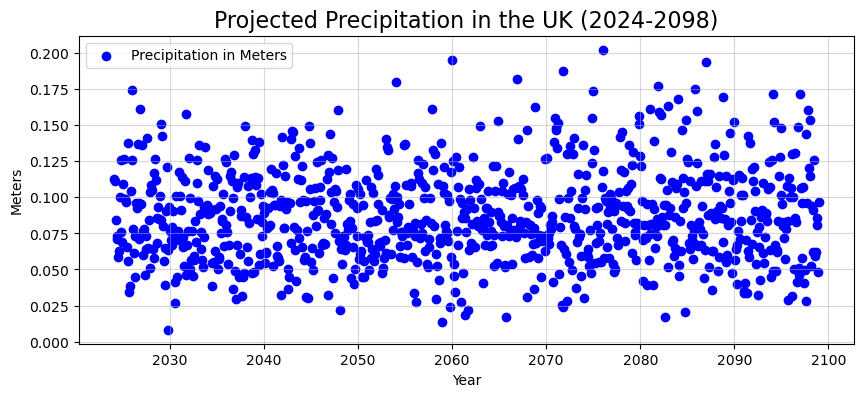

TypeError: play() got multiple values for argument 'rate'

In [ ]:
# File path
# precipitation in meters
# https://confluence.ecmwf.int/display/CKB/Climate+and+energy+indicators+for+Europe+Variable+Fact+Sheet%3A+Precipitation
precip_path = "data_files/P_CMI5_RCMO_CM20_TP-_0000m_Euro_NUT0_S197001010000_E209812312100_ACC_TIM_01m_NA-_cdf_org_01_RCP85_NA---_NA---.csv"

# Skip metadata rows and read the data
precip_df = pd.read_csv(
    precip_path, 
    skiprows=52,  # Skip rows up to the actual data header
    sep=',',      # Specify the correct delimiter (comma in this case)
    engine='python',  # Use Python engine for flexible parsing
    on_bad_lines='skip'  # Skip any problematic rows
)

# Display the first few rows to verify
# print(precip_df.head())

rows_size = len(precip_df)
# Ensure 'Date' is parsed as a datetime column
precip_df['Date'] = pd.to_datetime(precip_df['Date'])

# Filter rows between 2024 and 2098
precip_pred = precip_df[precip_df['Date'].dt.year >= 2024]

# Select only 'Date' and 'UK' columns
precip_uk = precip_pred[['Date', 'UK']]

# Display the resulting data
print(precip_uk)

plt.figure(figsize=(10, 4))
plt.scatter(precip_uk['Date'], precip_uk['UK'], label='Precipitation in Meters', color='blue')
plt.title('Projected Precipitation in the UK (2024-2098)', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Meters')
plt.grid(alpha=0.5)
plt.legend()
plt.show()

           Date        UK
648  2024-01-31  5.663002
649  2024-02-29  6.870473
650  2024-03-31  5.629517
651  2024-04-30  3.811083
652  2024-05-31  4.063906
...         ...       ...
1543 2098-08-31  3.462024
1544 2098-09-30  4.471978
1545 2098-10-31  4.152824
1546 2098-11-30  3.629667
1547 2098-12-31  4.886961

[900 rows x 2 columns]


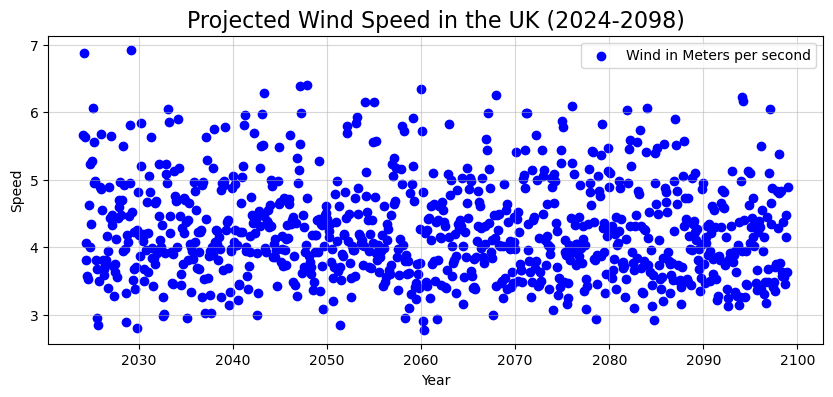

In [22]:
# File path
# wind speed Metres per second (m/s or m s-1) 10 meters
# https://confluence.ecmwf.int/display/CKB/Climate+and+energy+indicators+for+Europe+Variable+Fact+Sheet%3A+Wind+Speed
wind_path = "data_files/P_CMI5_RCMO_CM20_WS-_0010m_Euro_NUT0_S197001010000_E209812312100_INS_TIM_01m_NA-_cdf_org_01_RCP85_NA---_NA---.csv"

# Skip metadata rows and read the data
wind_df = pd.read_csv(
    wind_path, 
    skiprows=52,  # Skip rows up to the actual data header
    sep=',',      # Specify the correct delimiter (comma in this case)
    engine='python',  # Use Python engine for flexible parsing
    on_bad_lines='skip'  # Skip any problematic rows
)

# Display the first few rows to verify
# print(wind_df.head())

# Ensure 'Date' is parsed as a datetime column
wind_df['Date'] = pd.to_datetime(wind_df['Date'])

# Filter rows between 2024 and 2098
wind_pred = wind_df[wind_df['Date'].dt.year >= 2024]

# Select only 'Date' and 'UK' columns
wind_uk = wind_pred[['Date', 'UK']]

# Display the resulting data
print(wind_uk)

plt.figure(figsize=(10, 4))
plt.scatter(wind_uk['Date'], wind_uk['UK'], label='Wind in Meters per second', color='blue')
plt.title('Projected Wind Speed in the UK (2024-2098)', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Speed')
plt.grid(alpha=0.5)
plt.legend()
plt.show()